# <center><b><u>Cyberbullying Tweet Analysis
<b><center><u>Authors: Anoushka Nayak, Priyansha Rastogi

<i>We are using cyberbullying tweets dataset from Kaggle.</i>  
<i>It contains 47,692 rows and two object type columns: 'tweet_text' and 'cyberbullying_type'.</i>
<i>Here is the link to it: [Cyberbullying dataset](https://www.kaggle.com/datasets/andrewmvd/cyberbullying-classification)
</i><br>
    
<i>Based on our dataset, we have identified three main focus areas, that we can can work on using NLP.</i>
<i>These are as follows:</i><br>
    
<i><b> 1. Comparison of one cyberbullying type with the rest of them.</b></i><br>
<i><b> 2. Cyberbullying type detection via Text Completion and Classification using Transformers</b></i><br>
<i><b> 3. Positive platform creation via Text Generation by fine tuning parameters using GPT2</b></i><br>
    

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from wordcloud import WordCloud

In [ ]:
cb_data = pd.read_csv('cyberbullying_tweets.csv')
cb_data

,tweet_text,cyberbullying_type
0,"In other words #katandandre, your food was cra...",not_cyberbullying
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying
...,...,...
47687,"Black ppl aren't expected to do anything, depe...",ethnicity
47688,Turner did not withhold his disappointment. Tu...,ethnicity
47689,I swear to God. This dumb nigger bitch. I have...,ethnicity
47690,Yea fuck you RT @therealexel: IF YOURE A NIGGE...,ethnicity


### <b>Data Cleaning</br>
    
<i><b> For a feasible text analysis we are cleaning our dataset by performing these operations:</br></br>
    - Dropping the rows with null values.</br>
    - Dropping the duplicated rows.</br>
    - Removing the contractions like haven't, you're, etc.</br>
    - Removing Twitter usernames starting with '@'.</br>
    - Removing picture links.</br>
    - Removing sequence of digits.</br>
    - Removing non-alphabetic characters using regular expressions.</br>
    - Removing isolated single letters that may not provide meaningful information.</br>
    - Removing urls.</br>
    - Removing emojis and non-english characters.</br>

In [ ]:
# dropping rows with null values in the 'tweet_text' column
cb_data.dropna(subset=['tweet_text'])

,tweet_text,cyberbullying_type
0,"In other words #katandandre, your food was cra...",not_cyberbullying
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying
...,...,...
47687,"Black ppl aren't expected to do anything, depe...",ethnicity
47688,Turner did not withhold his disappointment. Tu...,ethnicity
47689,I swear to God. This dumb nigger bitch. I have...,ethnicity
47690,Yea fuck you RT @therealexel: IF YOURE A NIGGE...,ethnicity


In [ ]:
# Drop the duplicates
col_to_check = 'tweet_text'
value_counts = cb_data[col_to_check].value_counts()
duplicates_count = value_counts[value_counts > 1]

print("Total number of duplicates:", duplicates_count.sum())

Total number of duplicates: 3350


In [ ]:
cb_data.drop_duplicates(subset='tweet_text',keep='first',inplace=True)

In [ ]:
cb_data.duplicated().sum()

0

In [ ]:
!pip install contractions

Defaulting to user installation because normal site-packages is not writeable


In [ ]:
import contractions

In [ ]:
from contractions import contractions_dict
import pandas as pd

cb_data['tweet_text'] = cb_data['tweet_text'].apply(lambda x: contractions.fix(x))

# Now 'haven't' will be expanded to 'have not'
cb_data

,tweet_text,cyberbullying_type
0,"In other words #katandandre, your food was cra...",not_cyberbullying
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying
...,...,...
47687,"Black people are not expected to do anything, ...",ethnicity
47688,Turner did not withhold his disappointment. Tu...,ethnicity
47689,I swear to God. This dumb nigger bitch. I have...,ethnicity
47690,Yea fuck you RT @therealexel: IF YOU ARE A NIG...,ethnicity


In [ ]:
 # Remove Twitter usernames
cb_data['tweet_text'] = cb_data['tweet_text'].str.replace(r'\s*@\w+', '', regex=True)
cb_data['tweet_text'] = cb_data['tweet_text'].str.replace(r'\s*\B@\w+', '', regex=True)
cb_data['tweet_text'] = cb_data['tweet_text'].str.replace(r'\s*@\S+', '', regex=True)
cb_data['tweet_text'] = cb_data['tweet_text'].str.replace(r'\s*@\S+\b', '', regex=True)
cb_data

,tweet_text,cyberbullying_type
0,"In other words #katandandre, your food was cra...",not_cyberbullying
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying
2,a classy whore? Or more red velvet cupcakes?,not_cyberbullying
3,"meh. :P thanks for the heads up, but not too...",not_cyberbullying
4,This is an ISIS account pretending to be a Ku...,not_cyberbullying
...,...,...
47687,"Black people are not expected to do anything, ...",ethnicity
47688,Turner did not withhold his disappointment. Tu...,ethnicity
47689,I swear to God. This dumb nigger bitch. I have...,ethnicity
47690,Yea fuck you RT: IF YOU ARE A NIGGER FUCKING U...,ethnicity


In [ ]:
# Remove picture links using regular expressions
cb_data['tweet_text'] = cb_data['tweet_text'].str.replace(r'http[s]?:\/\/[^\s]*\.(?:jpg|jpeg|png|gif)', '', regex=True)
cb_data

,tweet_text,cyberbullying_type
0,"In other words #katandandre, your food was cra...",not_cyberbullying
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying
2,a classy whore? Or more red velvet cupcakes?,not_cyberbullying
3,"meh. :P thanks for the heads up, but not too...",not_cyberbullying
4,This is an ISIS account pretending to be a Ku...,not_cyberbullying
...,...,...
47687,"Black people are not expected to do anything, ...",ethnicity
47688,Turner did not withhold his disappointment. Tu...,ethnicity
47689,I swear to God. This dumb nigger bitch. I have...,ethnicity
47690,Yea fuck you RT: IF YOU ARE A NIGGER FUCKING U...,ethnicity


In [ ]:
# Remove sequences of digits using regular expressions
cb_data['tweet_text'] = cb_data['tweet_text'].str.replace(r'\d+', '', regex=True)
cb_data

,tweet_text,cyberbullying_type
0,"In other words #katandandre, your food was cra...",not_cyberbullying
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying
2,a classy whore? Or more red velvet cupcakes?,not_cyberbullying
3,"meh. :P thanks for the heads up, but not too...",not_cyberbullying
4,This is an ISIS account pretending to be a Ku...,not_cyberbullying
...,...,...
47687,"Black people are not expected to do anything, ...",ethnicity
47688,Turner did not withhold his disappointment. Tu...,ethnicity
47689,I swear to God. This dumb nigger bitch. I have...,ethnicity
47690,Yea fuck you RT: IF YOU ARE A NIGGER FUCKING U...,ethnicity


In [ ]:
# Remove non-alphabetic characters using regular expressions
cb_data['tweet_text'] = cb_data['tweet_text'].str.replace(r'[^a-zA-Z\s]', '', regex=True)
cb_data

,tweet_text,cyberbullying_type
0,In other words katandandre your food was crapi...,not_cyberbullying
1,Why is aussietv so white MKR theblock ImACeleb...,not_cyberbullying
2,a classy whore Or more red velvet cupcakes,not_cyberbullying
3,meh P thanks for the heads up but not too co...,not_cyberbullying
4,This is an ISIS account pretending to be a Ku...,not_cyberbullying
...,...,...
47687,Black people are not expected to do anything d...,ethnicity
47688,Turner did not withhold his disappointment Tur...,ethnicity
47689,I swear to God This dumb nigger bitch I have g...,ethnicity
47690,Yea fuck you RT IF YOU ARE A NIGGER FUCKING UN...,ethnicity


In [ ]:
# Remove isolated single letters that may not provide meaningful information.
cb_data['tweet_text'] = cb_data['tweet_text'].str.replace(r'\b[a-zA-Z]\b', '', regex=True)
cb_data

,tweet_text,cyberbullying_type
0,In other words katandandre your food was crapi...,not_cyberbullying
1,Why is aussietv so white MKR theblock ImACeleb...,not_cyberbullying
2,classy whore Or more red velvet cupcakes,not_cyberbullying
3,meh thanks for the heads up but not too con...,not_cyberbullying
4,This is an ISIS account pretending to be Kur...,not_cyberbullying
...,...,...
47687,Black people are not expected to do anything d...,ethnicity
47688,Turner did not withhold his disappointment Tur...,ethnicity
47689,swear to God This dumb nigger bitch have got...,ethnicity
47690,Yea fuck you RT IF YOU ARE NIGGER FUCKING UNF...,ethnicity


In [ ]:
# Remove the URLs
cb_data['tweet_text'] = cb_data['tweet_text'].replace(r'http\S+', '', regex=True).replace(r'www\S+', '', regex=True)
cb_data

,tweet_text,cyberbullying_type
0,In other words katandandre your food was crapi...,not_cyberbullying
1,Why is aussietv so white MKR theblock ImACeleb...,not_cyberbullying
2,classy whore Or more red velvet cupcakes,not_cyberbullying
3,meh thanks for the heads up but not too con...,not_cyberbullying
4,This is an ISIS account pretending to be Kur...,not_cyberbullying
...,...,...
47687,Black people are not expected to do anything d...,ethnicity
47688,Turner did not withhold his disappointment Tur...,ethnicity
47689,swear to God This dumb nigger bitch have got...,ethnicity
47690,Yea fuck you RT IF YOU ARE NIGGER FUCKING UNF...,ethnicity


In [ ]:
pip install emoji --upgrade

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [ ]:
# Remove emojis & non-english characters
import emoji
cb_data["tweet_text"] = cb_data["tweet_text"].apply(lambda s: emoji.replace_emoji(s, ''))
cb_data

,tweet_text,cyberbullying_type
0,In other words katandandre your food was crapi...,not_cyberbullying
1,Why is aussietv so white MKR theblock ImACeleb...,not_cyberbullying
2,classy whore Or more red velvet cupcakes,not_cyberbullying
3,meh thanks for the heads up but not too con...,not_cyberbullying
4,This is an ISIS account pretending to be Kur...,not_cyberbullying
...,...,...
47687,Black people are not expected to do anything d...,ethnicity
47688,Turner did not withhold his disappointment Tur...,ethnicity
47689,swear to God This dumb nigger bitch have got...,ethnicity
47690,Yea fuck you RT IF YOU ARE NIGGER FUCKING UNF...,ethnicity


### <b> Visualization </br>
<b><i> The pie chart below summarizes the percentage of tweets for each cyberbullying type.</br>
There are 6 cyberbullying types present in our 'cyberbullying_type' column. Those are:</br></br>
<i>- religion </br>
<i>- age </br>
<i>- ethnicity </br>
<i>- gender </br>
<i>- other cyberbullying</br>
<i>- not cyberbullying </br>

<b><i><b>'Religion' and 'age' are the major cyberbullying type texts, whereas 'other cyberbullying' type has the lowest frequency distribution of texts.
    

In [ ]:
statistics = cb_data['cyberbullying_type'].value_counts()
statistics

religion               7995
age                    7992
ethnicity              7952
not_cyberbullying      7937
gender                 7898
other_cyberbullying    6243
Name: cyberbullying_type, dtype: int64

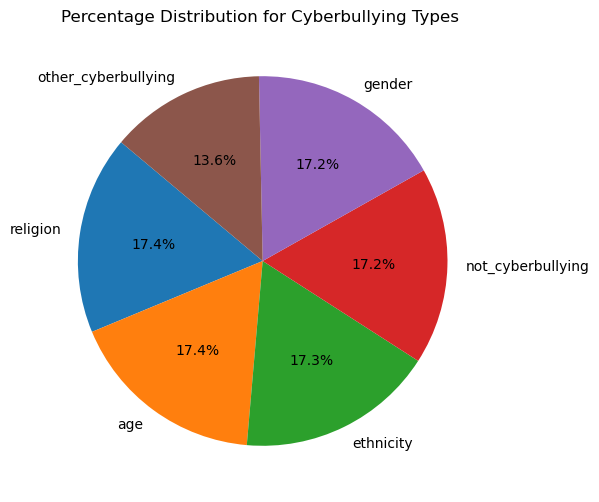

In [ ]:
counts = cb_data['cyberbullying_type'].value_counts()

plt.figure(figsize=(6, 6))
plt.pie(counts, labels=counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Percentage Distribution for Cyberbullying Types ')

plt.show()

### <b> Clean Text Generation for the tweets </br>
<b> <i>We are cleaning the text via removing the 'stopwords' and 'lemmatizing' the words, so that the text analysis omits the common words like 'the', 'as', etc and only shows the base root word for words that take different forms from a single word.      


In [ ]:
# Concatenated all the tweet_text
tweets = cb_data.tweet_text.str.cat(sep=' ').lower()
tweets

'in other words katandandre your food was crapilicious mkr why is aussietv so white mkr theblock imacelebrityau today sunrise studio neighbours wonderlandten etc   classy whore or more red velvet cupcakes  meh   thanks for the heads up but not too concerned about another angry dude on twitter  this is an isis account pretending to be  kurdish account  like islam it is all lies  yes the test of god is that good or bad or indifferent or weird or whatever it all proves gods existence itu sekolah ya bukan tempat bully ga jauh kaya neraka karma  hope it bites kat on the butt she is just nasty mkr  everything but mostly my priest rebecca black drops out of school due to bullying   the bully flushes on kd  ughhhh mkr rt turkish state has killed  children in last  years   news  googleeviricitopluluukrteyidee love that the best response to the hotcakes they managed to film was  noncommittal meh from some adolescent mkr  parem de fazer bullying comigo  uhahuah bando de preto  tadinhu de mim  sof

In [ ]:
from gensim.utils import tokenize
import nltk
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords

stop_words = set(stopwords.words('english'))

def clean_text(word):
    lemmatizer = WordNetLemmatizer()
    tokens = list(tokenize(word))
    res = [lemmatizer.lemmatize(t.lower()) for t in tokens if t.lower() not in stop_words]
    if len(res) == 0:
        return ' '
    else:
        return res

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\ADMIN\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\ADMIN\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\ADMIN\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [ ]:
tokens = clean_text(tweets)
len(tokens)

582367

### <b> Word Cloud </br>
<b><i> The representation showcases the words that appear in each cyberbullying type category, frequency wise; such that the words with highest word count appear larger and so on.</br>
    
<b><i>We have showcased the wordcloud for each cyberbullying type category in a separate code, so that it is clear to differentiate between the high frequency words in each category.

In [ ]:
from nltk.probability import FreqDist

In [ ]:
freqdist = FreqDist(tokens)
freqdist

FreqDist({'school': 9154, 'fuck': 6067, 'like': 5899, 'nigger': 5618, 'girl': 5524, 'joke': 5504, 'people': 5402, 'dumb': 5335, 'bully': 5321, 'high': 5097, ...})

In [ ]:
from matplotlib import pyplot as plt
%matplotlib inline
from wordcloud import WordCloud

In [ ]:
def make_word_cloud(words):
    wordc = WordCloud(width=1000, height=500, background_color="white").generate_from_frequencies(FreqDist(words))

    plt.figure(figsize=(20,10), facecolor='k')
    plt.imshow(wordc)
    plt.axis("off")

    plt.tight_layout(pad=0)

    plt.show()

### <b> Word cloud for the overall Tweets

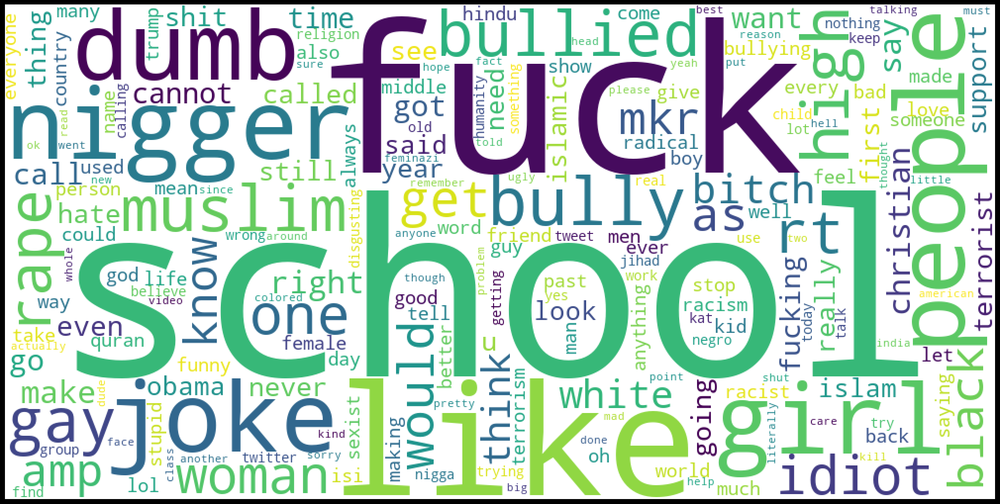

In [ ]:
make_word_cloud(tokens)

### <b> Word cloud for cyberbullying_type, 'GENDER'

In [ ]:
gender_data = cb_data[cb_data['cyberbullying_type'] == 'gender']
gender_data

,tweet_text,cyberbullying_type
7945,rape is realzvasiyana nema jokes about being d...,gender
7946,You never saw any celebrity say anything like ...,gender
7947,mean he is gay but he uses gendered slurs an...,gender
7948,RT feminazi,gender
7949,Rape is rape And the fact that read one post ...,gender
...,...,...
15913,Any females that really know me know Ion even ...,gender
15914,RT QuestionsForMen This ones good and topical,gender
15915,Sucks to have the smile wiped off your own fac...,gender
15916,No He said women choose to be gay men do not H...,gender


In [ ]:
tweets_gender = gender_data.tweet_text.str.cat(sep=' ').lower()
tokens_gender = clean_text(tweets_gender)

In [ ]:
freqdist = FreqDist(tokens_gender)
freqdist

FreqDist({'joke': 5295, 'rape': 4097, 'gay': 4008, 'rt': 1234, 'woman': 1184, 'bitch': 1155, 'call': 1111, 'female': 1108, 'people': 1102, 'sexist': 956, ...})

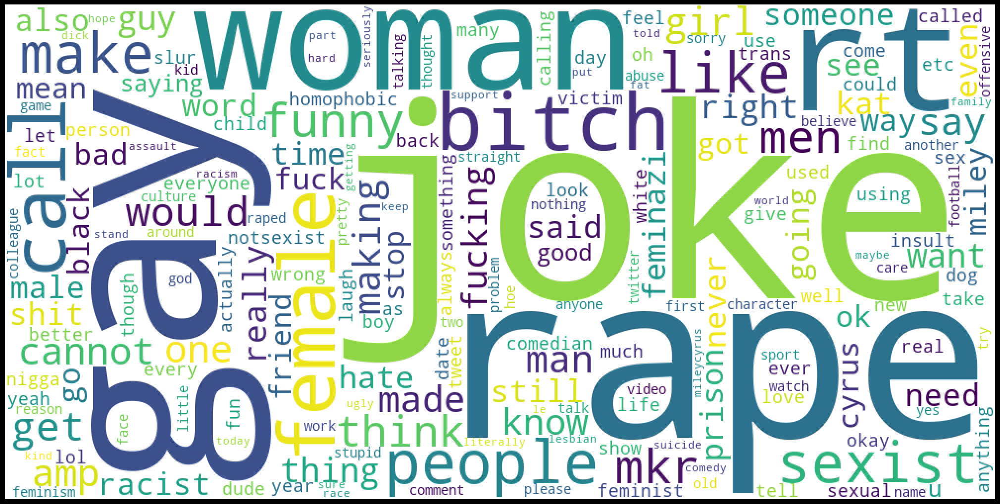

In [ ]:
make_word_cloud(tokens_gender)

### <b> Word cloud for cyberbullying_type, 'AGE'

In [ ]:
age_data = cb_data[cb_data['cyberbullying_type'] == 'age']
age_data

,tweet_text,cyberbullying_type
31739,Here at home Neighbors pick on my family and ...,age
31740,Being bullied at school Highachieving boys use...,age
31741,There was girl in my class in th grade who wa...,age
31742,He is probably white gay kid from some suburb...,age
31743,You are pushed ti resorting Treating thr bulli...,age
...,...,...
39726,This girl really tried to say bullied her in ...,age
39727,bully at school who has been messing with me ...,age
39728,remember wrote an entire song in th grade ca...,age
39729,was not the Prom Queen was the bullied girl ...,age


In [ ]:
tweets_age = age_data.tweet_text.str.cat(sep=' ').lower()
tokens_age = clean_text(tweets_age)

In [ ]:
freqdist = FreqDist(tokens_age)
freqdist

FreqDist({'school': 8526, 'high': 4945, 'girl': 4665, 'bullied': 4371, 'bully': 4346, 'like': 1888, 'one': 1045, 'people': 1010, 'would': 953, 'got': 848, ...})

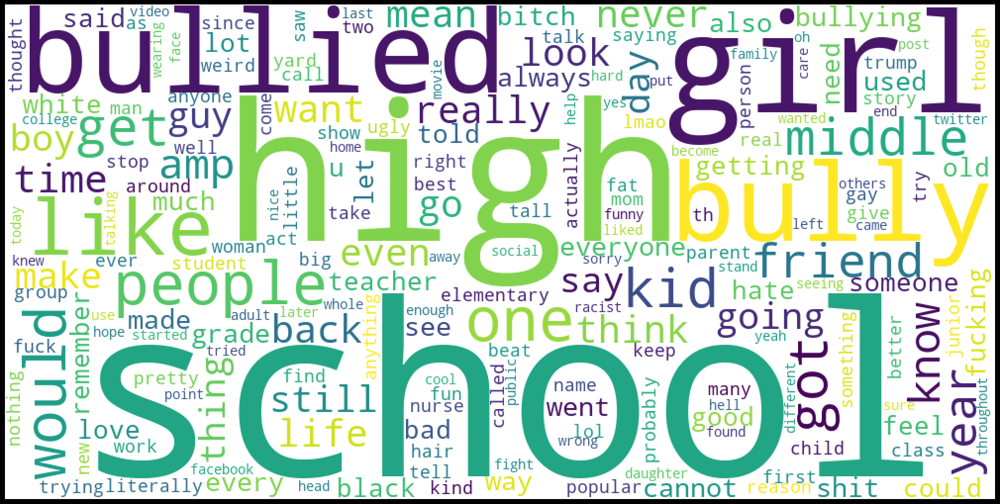

In [ ]:
make_word_cloud(tokens_age)

### <b> Word cloud for cyberbullying_type, 'RELIGION'

In [ ]:
religion_data = cb_data[cb_data['cyberbullying_type'] == 'religion']
religion_data

,tweet_text,cyberbullying_type
15918,Sudeep did she invite him though No right Why ...,religion
15919,Islam has never been resistance to oppressio...,religion
15920,Boy your comment about Journalists wanting to ...,religion
15921,Hindus were and are getting killed by Muslims...,religion
15922,White supremicists How many do you know There ...,religion
...,...,...
23911,Can you imagine if Christians came together li...,religion
23912,So how to support justice from the initial pro...,religion
23913,RT If you harbour any doubts about what Musli...,religion
23914,One thing about Muslims they want to extermin...,religion


In [ ]:
tweets_religion = religion_data.tweet_text.str.cat(sep=' ').lower()
tokens_religion = clean_text(tweets_religion)

In [ ]:
freqdist = FreqDist(tokens_religion)
freqdist

FreqDist({'muslim': 4640, 'idiot': 3062, 'christian': 2075, 'terrorist': 1385, 'right': 1302, 'woman': 1257, 'islamic': 1254, 'like': 1244, 'people': 1205, 'islam': 1195, ...})

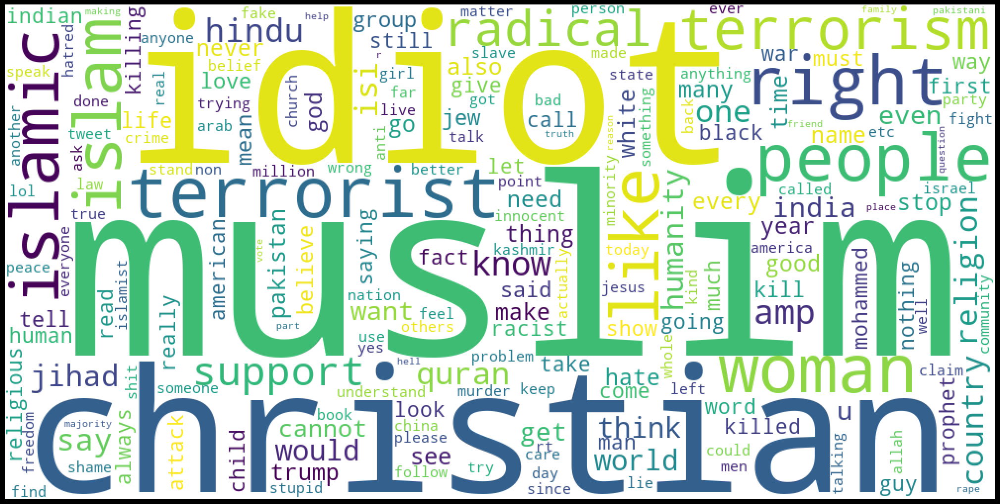

In [ ]:
make_word_cloud(tokens_religion)

### <b> Word cloud for cyberbullying_type, 'ETHNICITY'

In [ ]:
ethnicity_data = cb_data[cb_data['cyberbullying_type'] == 'ethnicity']
ethnicity_data

,tweet_text,cyberbullying_type
39731,Hey dumb fuck celebs stop doing something for ...,ethnicity
39732,Fuck you bitch RT FUCK OBAMA dumb ass nigger,ethnicity
39733,No Joe YOU are the RACIST They have so many v...,ethnicity
39734,when your truck looks dumb as fuck out trying ...,ethnicity
39735,That nigger food in the cafe today was disgusting,ethnicity
...,...,...
47687,Black people are not expected to do anything d...,ethnicity
47688,Turner did not withhold his disappointment Tur...,ethnicity
47689,swear to God This dumb nigger bitch have got...,ethnicity
47690,Yea fuck you RT IF YOU ARE NIGGER FUCKING UNF...,ethnicity


In [ ]:
tweets_ethnicity = ethnicity_data.tweet_text.str.cat(sep=' ').lower()
tokens_ethnicity = clean_text(tweets_ethnicity)

In [ ]:
freqdist = FreqDist(tokens_ethnicity)
freqdist

FreqDist({'nigger': 5614, 'fuck': 5405, 'dumb': 5162, 'as': 2268, 'black': 2148, 'white': 1569, 'people': 1403, 'rt': 1187, 'obama': 1142, 'one': 1068, ...})

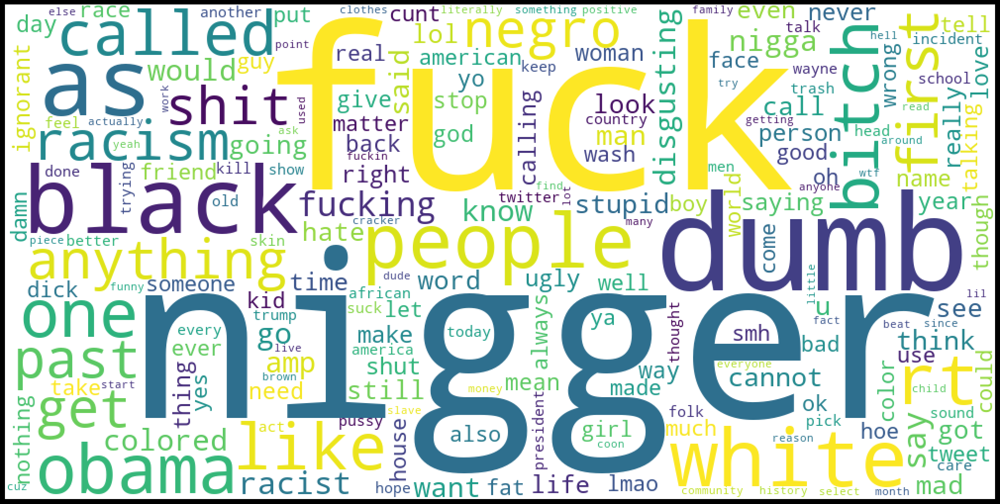

In [ ]:
make_word_cloud(tokens_ethnicity)

### <b> Word cloud for cyberbullying_type, 'OTHER_CYBERBULLYING'

In [ ]:
other_cyberbullying_data = cb_data[cb_data['cyberbullying_type'] == 'other_cyberbullying']
other_cyberbullying_data

,tweet_text,cyberbullying_type
23916,fyi it looks like was caught by it am not ...,other_cyberbullying
23918,RMAed my monoprice Shoddy power bricks on thos...,other_cyberbullying
23921,did not mention your name call out behavior ...,other_cyberbullying
23922,RT swear people are so fucking ignorant and a...,other_cyberbullying
23923,Yeah have got bit of rageboner Mentally spe...,other_cyberbullying
...,...,...
31731,oh gosh hope not,other_cyberbullying
31733,driving the opposite direction heading down ...,other_cyberbullying
31735,why are you giving these idiots airtime Growi...,other_cyberbullying
31737,misandry is not word iOS can autocomplete,other_cyberbullying


In [ ]:
tweets_other_cyberbullying = other_cyberbullying_data.tweet_text.str.cat(sep=' ').lower()
tokens_other_cyberbullying = clean_text(tweets_other_cyberbullying)

In [ ]:
freqdist = FreqDist(tokens_other_cyberbullying)
freqdist

FreqDist({'rt': 749, 'bully': 541, 'like': 406, 'people': 382, 'fucking': 364, 'get': 306, 'idiot': 268, 'would': 243, 'know': 239, 'think': 219, ...})

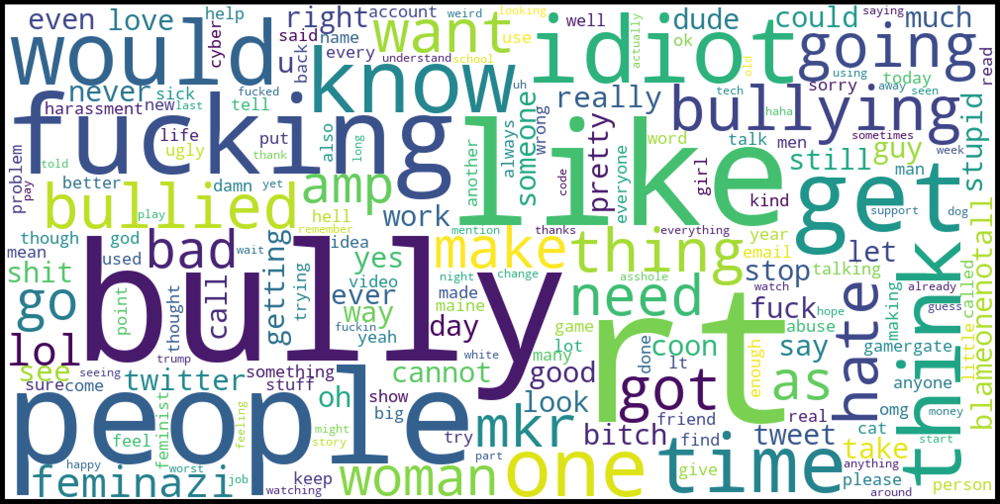

In [ ]:
make_word_cloud(tokens_other_cyberbullying)

### <b> Word cloud for cyberbullying_type, 'NOT_CYBERBULLYING'

In [ ]:
not_cyberbullying_data = cb_data[cb_data['cyberbullying_type'] == 'not_cyberbullying']
not_cyberbullying_data

,tweet_text,cyberbullying_type
0,In other words katandandre your food was crapi...,not_cyberbullying
1,Why is aussietv so white MKR theblock ImACeleb...,not_cyberbullying
2,classy whore Or more red velvet cupcakes,not_cyberbullying
3,meh thanks for the heads up but not too con...,not_cyberbullying
4,This is an ISIS account pretending to be Kur...,not_cyberbullying
...,...,...
7940,do not know what want to wearugh,not_cyberbullying
7941,Argh another round of instant restaurantsover ...,not_cyberbullying
7942,Teacher sets up new charity to tackle antigay ...,not_cyberbullying
7943,can barely tolerate Kat and Andre Katie and N...,not_cyberbullying


In [ ]:
tweets_not_cyberbullying = not_cyberbullying_data.tweet_text.str.cat(sep=' ').lower()
tokens_not_cyberbullying = clean_text(tweets_not_cyberbullying)

In [ ]:
freqdist = FreqDist(tokens_not_cyberbullying)
freqdist

FreqDist({'mkr': 1683, 'rt': 782, 'bullying': 693, 'like': 402, 'bully': 392, 'school': 375, 'get': 353, 'people': 300, 'would': 292, 'kat': 289, ...})

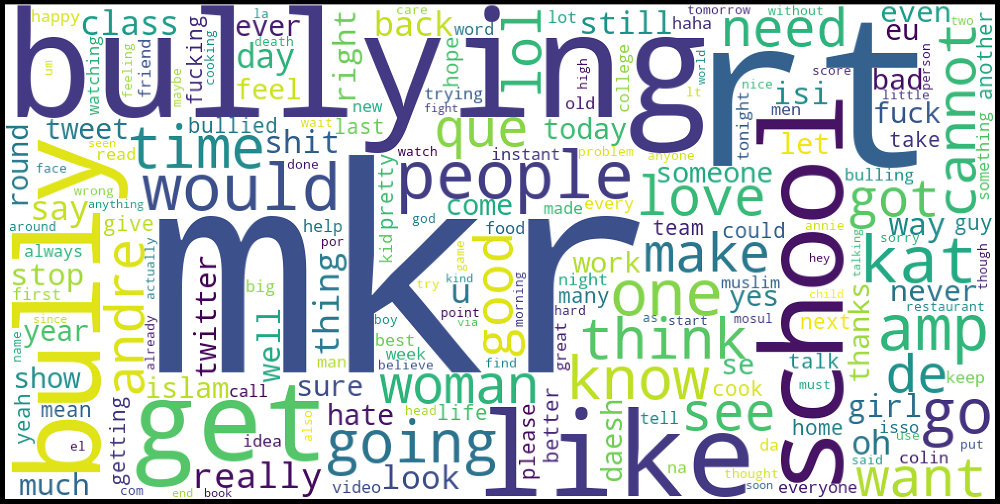

In [ ]:
make_word_cloud(tokens_not_cyberbullying)

### <b>MultiClass Classification</br>
<b><i> We are using this Machine learning model to test the accuracy of prediction for each cyberbullying type identified for the Tweet texts in our dataset. Based on that we have our findings below in the conclusion.

In [ ]:
stop_words = set(stopwords.words('english'))

def clean_text2(word):
    lemmatizer = WordNetLemmatizer()
    tokens = list(tokenize(word))
    cleaned_tokens= [lemmatizer.lemmatize(t.lower()) for t in tokens if t.lower() not in stop_words]
    cleaned_text = ' '.join(cleaned_tokens)
    return cleaned_text

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [ ]:
vectorizer = TfidfVectorizer(preprocessor = clean_text2, ngram_range = (1,2))
X = vectorizer.fit_transform(cb_data['tweet_text'])
y = cb_data['cyberbullying_type']

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
from sklearn.naive_bayes import MultinomialNB
clf = MultinomialNB()

clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

from sklearn.metrics import classification_report
report = classification_report(y_test, y_pred)
print(report)

                     precision    recall  f1-score   support

                age       0.61      0.99      0.76      1545
          ethnicity       0.84      0.94      0.89      1635
             gender       0.79      0.85      0.82      1548
  not_cyberbullying       0.67      0.41      0.51      1638
other_cyberbullying       0.65      0.09      0.16      1267
           religion       0.75      0.98      0.85      1571

           accuracy                           0.73      9204
          macro avg       0.72      0.71      0.66      9204
       weighted avg       0.72      0.73      0.68      9204



### <b>Model Accuracy: </b><br>

<b><i>The classifier correctly predicted as below: <br>
    
<b><i>- 61% of the tweets belong to the class "age".<br>
<b><i>- 84% of the tweets belong to the class "ethnicity".<br>
<b><i>- 79% of the tweets belong to the class "gender".<br>
<b><i>- 67% of the tweets belong to the class "not_cyberbullying".<br>
<b><i>- 65% of the tweets belong to the class "other_cyberbullying".<br>
<b><i>- 75% of the tweets belong to the class "religion".<br>
    
<b><i>Based on this we can conclude that 'ethnicity' category is predicted most accurately while the 'age' category is the hardest to predict accurately. The overall accuracy of prediction is 72%.</i></b>

In [ ]:
from sklearn.preprocessing import LabelEncoder
lenc = LabelEncoder()
cb_data['save_type'] = cb_data['cyberbullying_type']
cb_data.cyberbullying_type = lenc.fit_transform(cb_data.cyberbullying_type)

In [ ]:
cb_data

,tweet_text,cyberbullying_type,save_type
0,In other words katandandre your food was crapi...,3,not_cyberbullying
1,Why is aussietv so white MKR theblock ImACeleb...,3,not_cyberbullying
2,classy whore Or more red velvet cupcakes,3,not_cyberbullying
3,meh thanks for the heads up but not too con...,3,not_cyberbullying
4,This is an ISIS account pretending to be Kur...,3,not_cyberbullying
...,...,...,...
47687,Black people are not expected to do anything d...,1,ethnicity
47688,Turner did not withhold his disappointment Tur...,1,ethnicity
47689,swear to God This dumb nigger bitch have got...,1,ethnicity
47690,Yea fuck you RT IF YOU ARE NIGGER FUCKING UNF...,1,ethnicity


### <b>Confusion Matrix</br>
<b><i>This shows the number of Tweet texts that are predicted accurately for each cyberbullying type category.

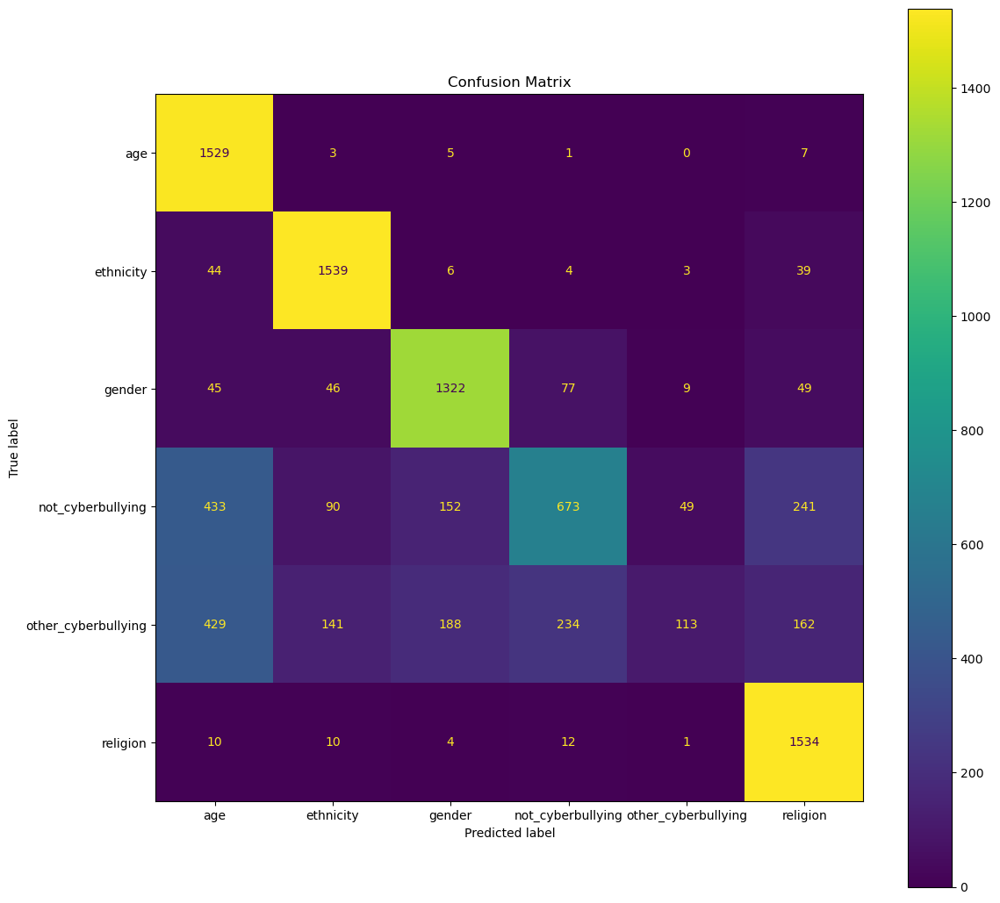

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(cm, display_labels=lenc.classes_)
fig, ax = plt.subplots(figsize=(13,13))
disp.plot(ax=ax)
plt.title("Confusion Matrix")
plt.show()

## <b>1. Comparison of one cyberbullying type with the rest of them.</br>

<b><i> The purpose is to identify unique words in each cyberbullying type category.

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer

cb_data['cyberbullying_type'] = cb_data['save_type']
cb_data = cb_data.drop('save_type', axis=1)
unique_words_dict = {}

for chosen_type in cb_data['cyberbullying_type'].unique():
    # Filter data for the chosen cyberbullying type
    chosen_data = cb_data[cb_data['cyberbullying_type'] == chosen_type]

    vectorizer = CountVectorizer()
    X = vectorizer.fit_transform(chosen_data['tweet_text'])

    # Calculate unique words for the chosen type
    unique_words = set(vectorizer.get_feature_names_out())
    unique_words_dict[chosen_type] = unique_words

unique_words_dict_against_others = {}

for key, target_set in unique_words_dict.items():
    unique_words = target_set.copy()
    for other_key, other_set in unique_words_dict.items():
        if key != other_key:
            unique_words -= other_set
    unique_words_dict_against_others[key] = unique_words

total_unique_words = set()

# Print the top 20 unique words for each cyberbullying type
for cyberbullying_type, unique_words in unique_words_dict_against_others.items():
    top_20_unique_words = list(unique_words)[:20]
    print(f'Top 20 unique words for {cyberbullying_type}: {top_20_unique_words}')

    total_unique_words.update(top_20_unique_words)

Top 20 unique words for not_cyberbullying: ['classics', 'gohardorgohome', 'parece', 'uihauihuaihuiahuiah', 'hocr', 'famosa', 'bom', 'kaz', 'arma', 'alsatian', 'mereces', 'sockfetish', 'hevy', 'twon', 'dysentery', 'viendo', 'deconstruction', 'healthbenefits', 'mesmo', 'asrul']
Top 20 unique words for gender: ['necthink', 'bobble', 'coasttocoast', 'bitchesfemales', 'groundless', 'foothill', 'obamahitler', 'laos', 'everyome', 'mannnnnn', 'whatacow', 'expanse', 'sosueme', 'clickbait', 'mommas', 'twitteracting', 'femanist', 'assaultingattackinghumiliating', 'gophateswomen', 'tribesmen']
Top 20 unique words for religion: ['torched', 'rislamic', 'hollyweird', 'thealley', 'taleban', 'hamaz', 'lodges', 'dehumanization', 'proudofisro', 'youan', 'fatwah', 'qoum', 'srinagar', 'institutes', 'notdictateyourdietarychoicesherearegoodreasonsmeatand', 'criminalthat', 'paragon', 'junkterrorbillnow', 'staues', 'shiplap']
Top 20 unique words for other_cyberbullying: ['ror', 'flailing', 'ronin', 'toolbag', 

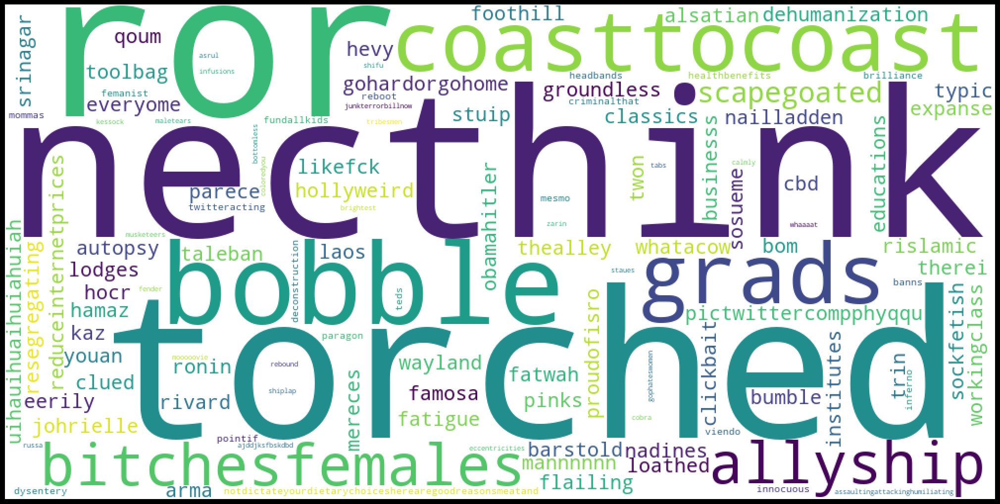

In [ ]:
# Wordcloud for all the unique words across each category
make_word_cloud(total_unique_words)

### <b> Sentiment Analysis

<b> We are performing Sentiment Analysis on:<br>
    
<b><i> A. each cyberbullying type category finding the top 20 negative unique words.</i></b><br>
<b><i> B. each cyberbullying type category finding the top 20 common negative words.</i></b>
    
<b><i>For here only, we are just limiting the number of words to 20, to print the output, since the dataset is huge with 45k tweet text rows.</i></b>
    
<b><i>We are also plotting bar chart for the top 20 unique negative and top 20 common negative words in each cyberbullying type category.</i></b>

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from textblob import TextBlob
import nltk
nltk.download('punkt')

top_negative_words_dict = {}

# Perform sentiment analysis on the unique words for each category
for cyberbullying_type, unique_words in unique_words_dict_against_others.items():
    #print(cyberbullying_type, "hello 5")
    top_negative_words = []
    for word in unique_words:
        # Get the sentiment polarity of the word
        sentiment_polarity = TextBlob(word).sentiment.polarity
        # Consider words with negative sentiment polarity
        if sentiment_polarity < 0:
            top_negative_words.append((word, sentiment_polarity))
    # Sort words based on sentiment polarity and keep the top negative words
    top_negative_words.sort(key=lambda x: x[1], reverse=True)
    top_negative_words_dict[cyberbullying_type] = top_negative_words[:20]

# Print the top 20 negative words for each cyberbullying type
for cyberbullying_type, top_negative_words in top_negative_words_dict.items():
    print(f'Top 20 negative words for {cyberbullying_type}:')
    for word, sentiment_polarity in top_negative_words:
        print(f'{word} (Sentiment Polarity: {sentiment_polarity:.2f})')
    print()


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\ADMIN\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


Top 20 negative words for not_cyberbullying:
coma (Sentiment Polarity: -0.10)
jammed (Sentiment Polarity: -0.10)
uncooked (Sentiment Polarity: -0.10)
mediocrity (Sentiment Polarity: -0.20)
mindlessly (Sentiment Polarity: -0.20)
sentimental (Sentiment Polarity: -0.25)
weakly (Sentiment Polarity: -0.38)
caustic (Sentiment Polarity: -0.40)
unappealing (Sentiment Polarity: -0.40)
frustratingly (Sentiment Polarity: -0.40)
unashamed (Sentiment Polarity: -0.50)
uninspired (Sentiment Polarity: -0.50)
churning (Sentiment Polarity: -0.50)
haphazard (Sentiment Polarity: -0.60)
haphazardly (Sentiment Polarity: -0.60)
grrrr (Sentiment Polarity: -0.70)
grr (Sentiment Polarity: -0.70)
doubtful (Sentiment Polarity: -0.80)

Top 20 negative words for gender:
passionately (Sentiment Polarity: -0.05)
depress (Sentiment Polarity: -0.07)
allusions (Sentiment Polarity: -0.10)
inexperienced (Sentiment Polarity: -0.10)
redundantly (Sentiment Polarity: -0.20)
misplaced (Sentiment Polarity: -0.20)
repetitive (Se

<b><i> A. Bar plot for each cyberbullying type category finding the top 20 negative unique words.</i></b>

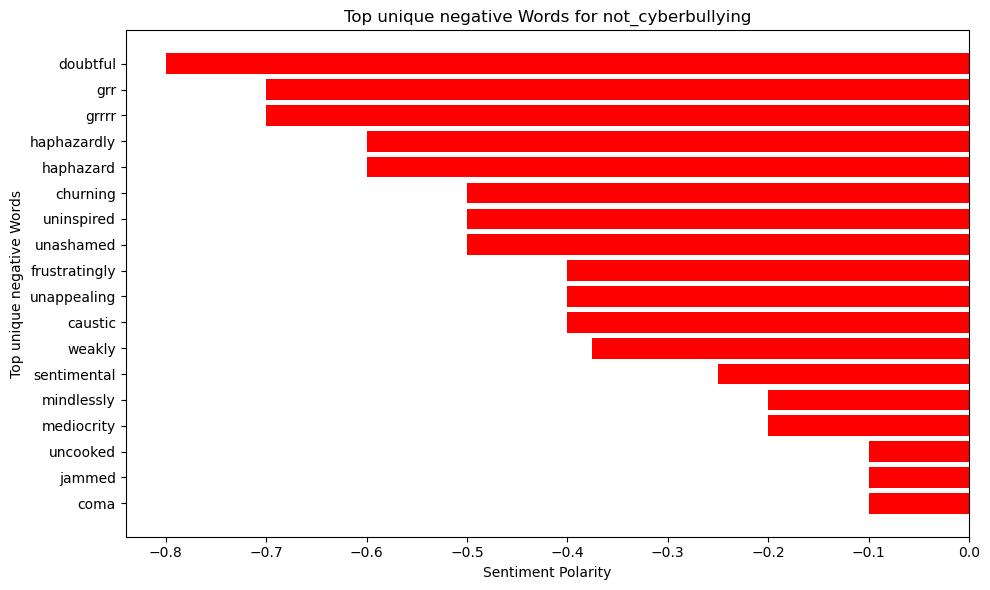

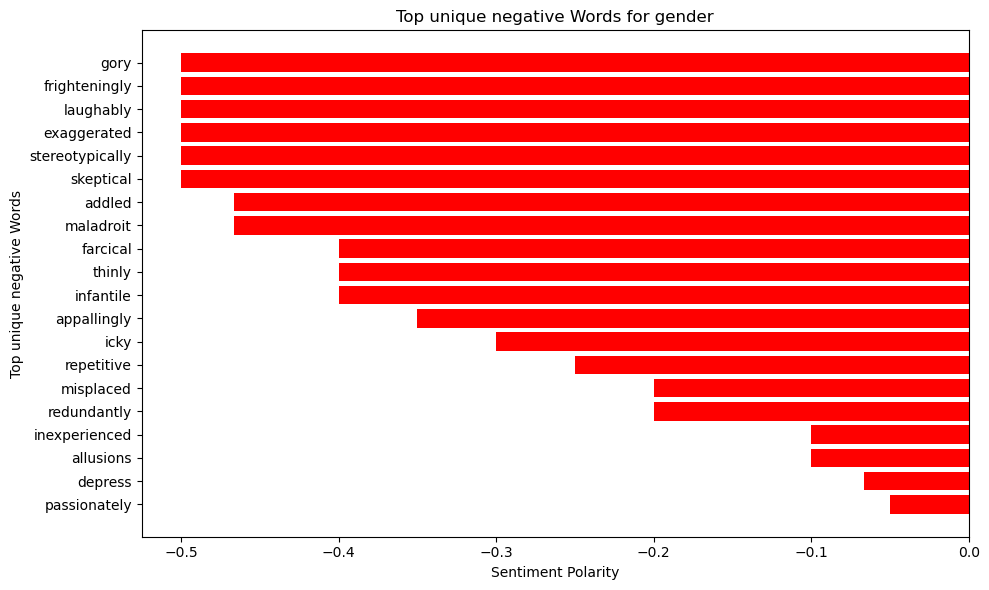

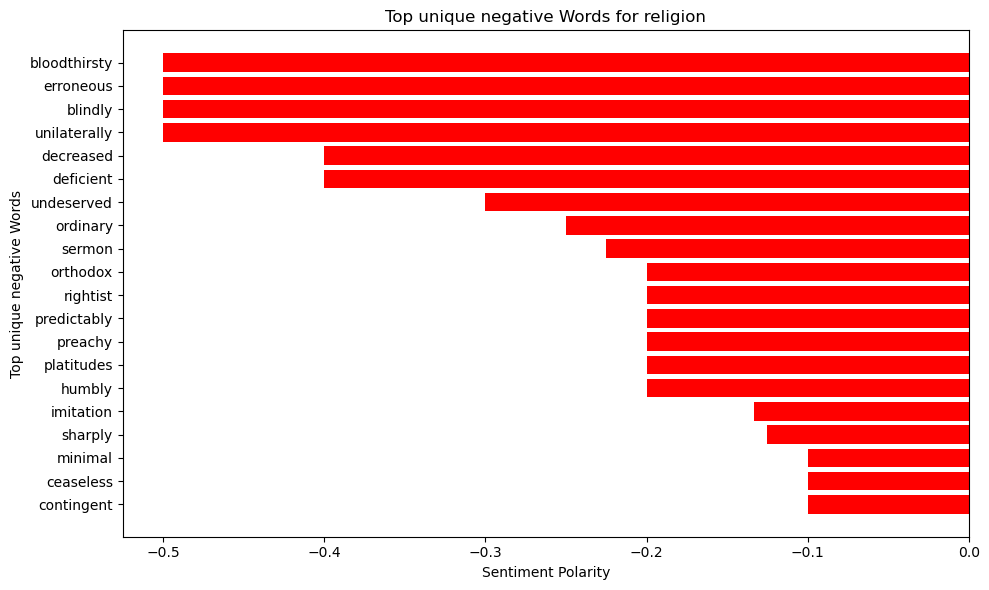

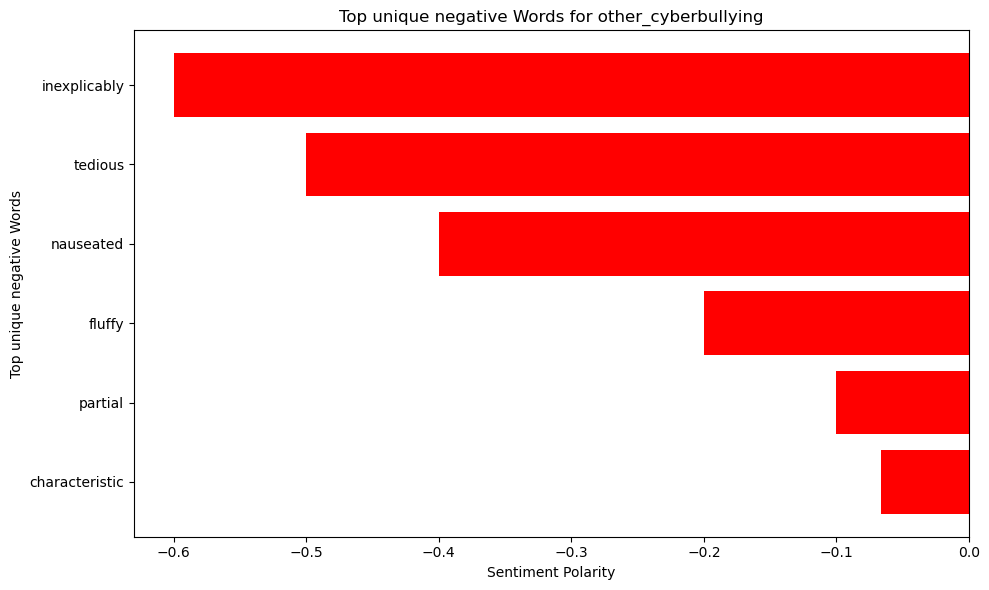

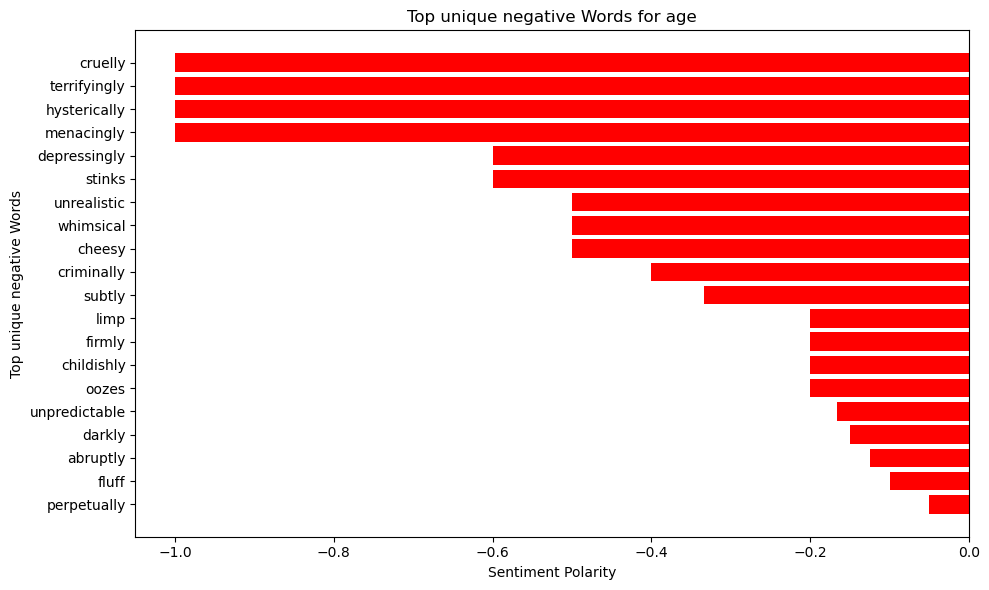

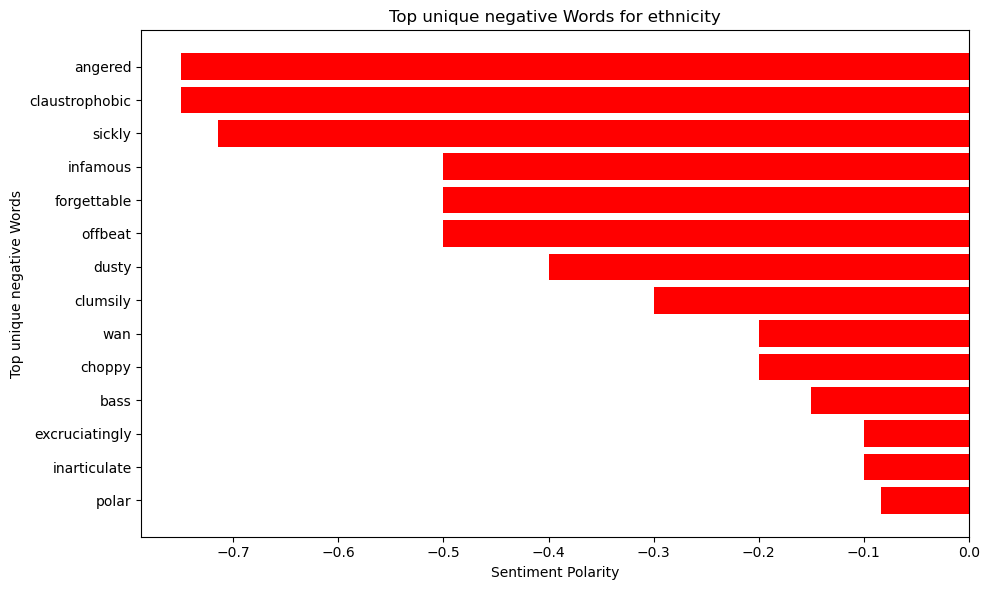

In [ ]:
# Plot a graph for the top 20 unique negative words in each category
for cyberbullying_type, top_negative_words in top_negative_words_dict.items():
    words, polarities = zip(*top_negative_words)
    plt.figure(figsize=(10, 6))
    plt.barh(words, polarities, color='red')
    plt.xlabel('Sentiment Polarity')
    plt.ylabel('Top unique negative Words')
    plt.title(f'Top unique negative Words for {cyberbullying_type}')
    plt.tight_layout()
    plt.show()

<b> Sentiment Analysis on each category, finding the top 20 common negative words.

In [ ]:
from collections import Counter
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords

import nltk
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\ADMIN\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\ADMIN\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [ ]:
import matplotlib.pyplot as plt
from textblob import TextBlob
from nltk.corpus import stopwords
from collections import Counter

stop_words = set(stopwords.words('english'))

top_negative_words_common_dict = {}

# Perform sentiment analysis on the tweet text for each category
for cyberbullying_type in cb_data['cyberbullying_type'].unique():
    category_df = cb_data[cb_data['cyberbullying_type'] == cyberbullying_type]
    all_words = ' '.join(category_df['tweet_text']).lower().split()

    # Remove stopwords and short words
    filtered_words = [word for word in all_words if word not in stop_words and len(word) >= 3]

    # Calculate sentiment polarity for each word
    word_polarities = {}
    for word in filtered_words:
        sentiment_polarity = TextBlob(word).sentiment.polarity
        if sentiment_polarity < 0:
            word_polarities[word] = sentiment_polarity

    # Get the top 20 negative words
    top_negative_words = Counter(word_polarities).most_common(20)
    top_negative_words_common_dict[cyberbullying_type] = top_negative_words

# Display the top 20 negative words for each cyberbullying type
for cyberbullying_type, top_negative_words in top_negative_words_common_dict.items():
    print(f'Top 20 negative words for {cyberbullying_type}:')
    for word, sentiment_polarity in top_negative_words:
        print(f'{word} (Sentiment Polarity: {sentiment_polarity:.2f})')
    print()

Top 20 negative words for not_cyberbullying:
vacuum (Sentiment Polarity: -0.01)
absence (Sentiment Polarity: -0.01)
flat (Sentiment Polarity: -0.03)
toilet (Sentiment Polarity: -0.03)
long (Sentiment Polarity: -0.05)
minor (Sentiment Polarity: -0.05)
monkey (Sentiment Polarity: -0.05)
excuse (Sentiment Polarity: -0.05)
strange (Sentiment Polarity: -0.05)
passionate (Sentiment Polarity: -0.05)
arrest (Sentiment Polarity: -0.05)
leftist (Sentiment Polarity: -0.05)
grey (Sentiment Polarity: -0.05)
dry (Sentiment Polarity: -0.07)
single (Sentiment Polarity: -0.07)
limited (Sentiment Polarity: -0.07)
victim (Sentiment Polarity: -0.08)
loose (Sentiment Polarity: -0.08)
loosely (Sentiment Polarity: -0.08)
lonely (Sentiment Polarity: -0.10)

Top 20 negative words for gender:
vacuum (Sentiment Polarity: -0.01)
flat (Sentiment Polarity: -0.03)
strange (Sentiment Polarity: -0.05)
long (Sentiment Polarity: -0.05)
leftist (Sentiment Polarity: -0.05)
excuse (Sentiment Polarity: -0.05)
passionate (Se

<b><i> B. Bar plot for each cyberbullying type category finding the top 20 common negative words.</i></b>

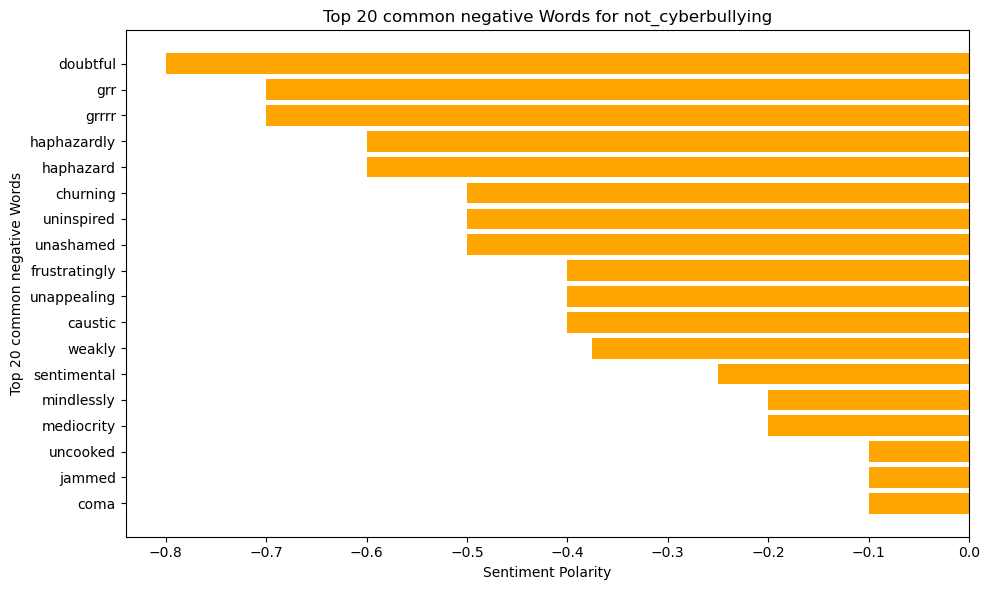

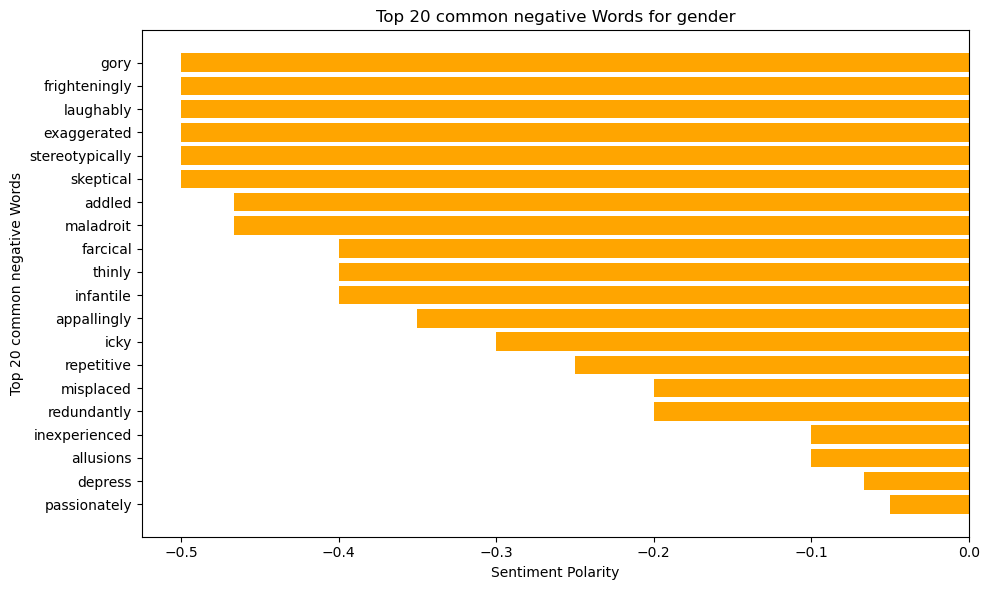

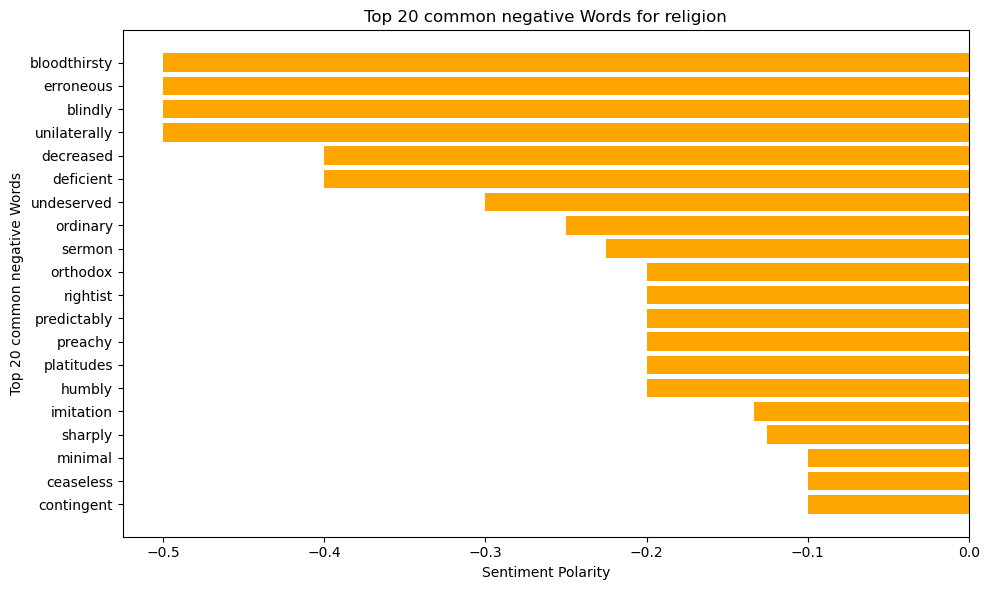

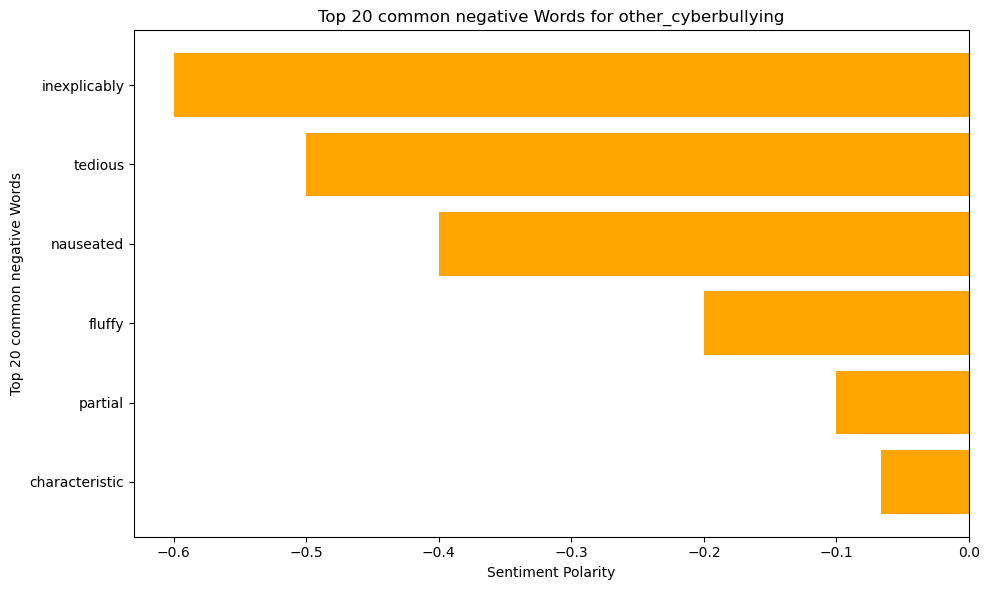

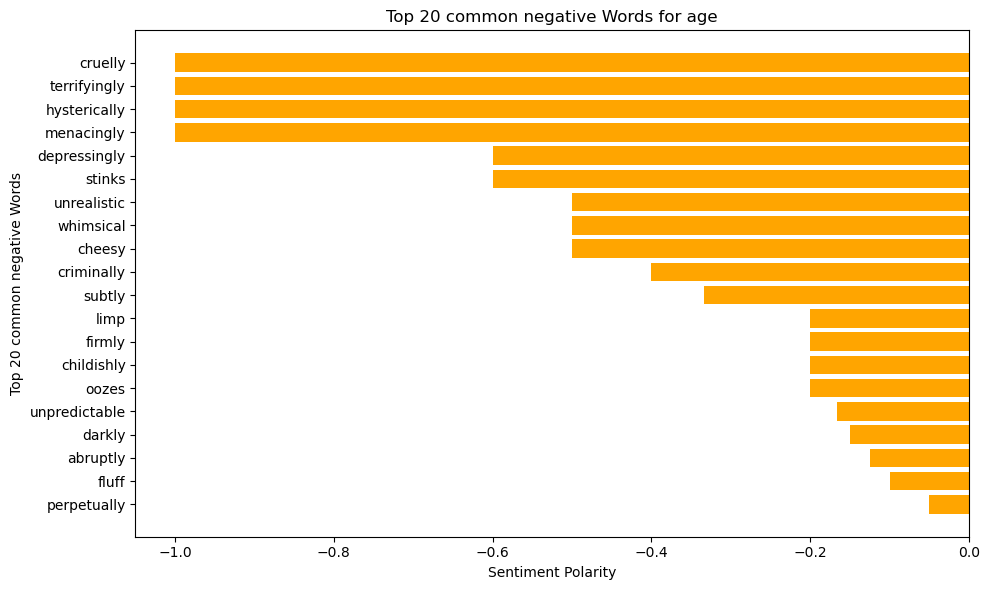

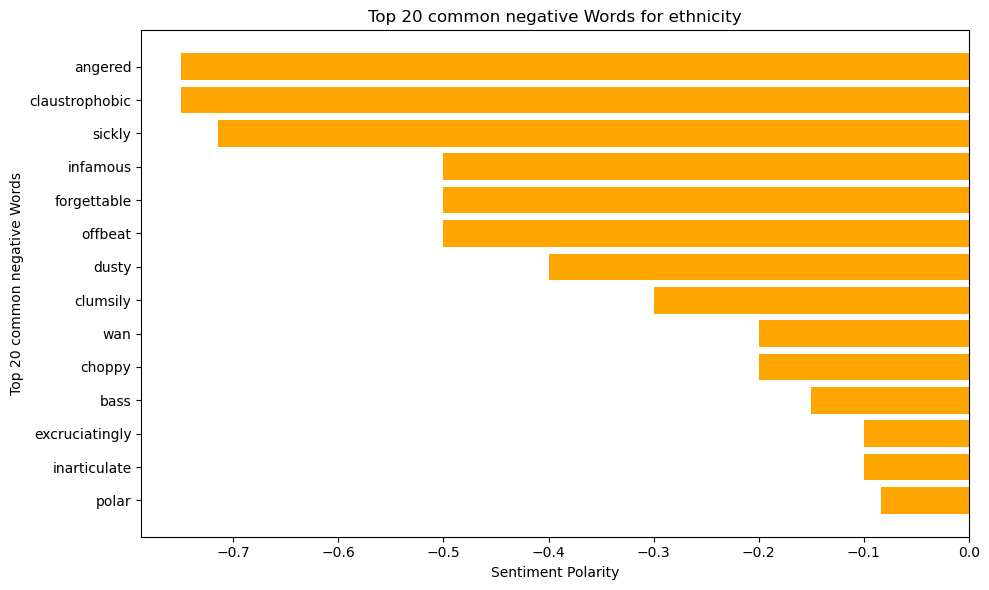

In [ ]:
# Plot a graph for the top 20 negative words in each category
for cyberbullying_type, top_negative_words in top_negative_words_dict.items():
    words, polarities = zip(*top_negative_words)
    plt.figure(figsize=(10, 6))
    plt.barh(words, polarities, color='orange')
    plt.xlabel('Sentiment Polarity')
    plt.ylabel('Top 20 common negative Words')
    plt.title(f'Top 20 common negative Words for {cyberbullying_type}')
    plt.tight_layout()
    plt.show()

### <b> Our main aim for Sentiment Analysis:</b></h1></br>
<b><i>We are performing sentiment analysis for unique words as well as common words for each cyberbullying type category, so that we are able to generate a comprehensive list of negative words that can be utilized for omission while text completion, when user inputs a tweet text.</i>
    

## <i><b> 2. Cyberbullying type detection via Text Completion and Classification using Transformers</b></i></br>

<i><b> We are using Transformers for this operation, using the tweets in the 'tweet_type' column in our dataset.</i></b></br>

<i><b>The purpose is to generate the complete tweet when an user inputs a tweet text for testing and also identify the cyberbullying type based on the generated text.</i> </b><br>

<b><i>If the cyberbullying type is identified as a cyberbullying type (excluding the 'not cyberbullying type' category) then it will display a "Warning" message alerting the user.</i></b>

In [ ]:
!pip install transformers

Defaulting to user installation because normal site-packages is not writeable


In [ ]:
import pandas as pd
from transformers import AutoTokenizer, AutoModelForSequenceClassification
import torch
import warnings

cb_data = pd.read_csv('cyberbullying_tweets.csv')

tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")
model = AutoModelForSequenceClassification.from_pretrained("bert-base-uncased")

# Define a function to find complete tweet text and its corresponding cyberbullying type
def find_tweet_and_type(incomplete_text):
    for index, row in cb_data.iterrows():
        if incomplete_text.lower() in row['tweet_text'].lower():
            tweet = row['tweet_text']
            cyberbullying_type = row['cyberbullying_type']

            inputs = tokenizer(tweet, return_tensors="pt", padding=True, truncation=True)
            outputs = model(**inputs)
            logits = outputs.logits
            predictions = torch.softmax(logits, dim=-1)

            # Assuming 0 index for 'not cyberbullying' and 1 index for 'cyberbullying'
            probabilities = predictions[0].tolist()
            not_cyberbullying_prob = probabilities[0]
            cyberbullying_prob = probabilities[1]

            print(f"Complete Tweet: {tweet}")
            print(f"Cyberbullying Type: {cyberbullying_type}")
            print(f"Not Cyberbullying Probability: {not_cyberbullying_prob}")
            print(f"Cyberbullying Probability: {cyberbullying_prob}")

            if cyberbullying_type != "not_cyberbullying":
                warnings.warn("User Warning: Your account may be suspended, if there is any more violation of user community guidelines.")
            return

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.weight', 'classifier.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


<b><i> Testing our code for text completion based on our 'tweet_text' column.

In [ ]:
# Testing cyberbullying
incomplete_text = "RT @Raul_Novoa16:"
find_tweet_and_type(incomplete_text)

Complete Tweet: RT @Raul_Novoa16: @AliciaBernardez @Alex_Aim @_mecaesmal  feminazi
Cyberbullying Type: gender
Not Cyberbullying Probability: 0.6215973496437073
Cyberbullying Probability: 0.3784026503562927


C:\Users\ADMIN\AppData\Local\Temp\ipykernel_8924\2693119779.py:34: UserWarning: User Warning: Your account may be suspended, if there is any more violation of user community guidelines.
  warnings.warn("User Warning: Your account may be suspended, if there is any more violation of user community guidelines.")


In [ ]:
# Testing not cyberbullying
incomplete_text = "@stockputout"
find_tweet_and_type(incomplete_text)

Complete Tweet: @stockputout everything but mostly my priest
Cyberbullying Type: not_cyberbullying
Not Cyberbullying Probability: 0.6353844404220581
Cyberbullying Probability: 0.3646155297756195


## <b> 3. Positive platform creation via Text Generation by fine tuning parameters using GPT2</b></br>
<i><b> We are using GPT2 to generate text based on fine tuning a few parameters: our sentiment analysis such that when an user inputs a text the auto suggest should omit the top 20 negative, top 20 unique negative and the top 20 words with the highest frequency in each cyberbullying type category (except the not cyberbullying type category) and generate a tweet based on that.</br></br>

<b>Reasoning behind our selections for omission: <br>
- We are doing such a selection for omitting the words while generating tweet texts, since there is a limitation to the scope of project and dataset.<br>   
- The reason for selecting the top 20 unique negative words is that those words would not appear in any other category and have highest negative sentiment attached to it.<br>  
- The reason for selecting the top 20 common negative words is for the same reason, but just to omit the common negative sentiment words across each category as well. <br>
- We chose only the top 20 unique words for each category since the negative sentiment of the words is also dependent on its usage and differs by cultural context etc and as the sentiment polarity would decrease the words will differ more in meaning as per usage, so we are taking into account the frequnecy here instead.<br>
- Our decision to omit the top 20 words with the highest frequency in each cyberbullying type category is solely based on intuition from the fact that those words would be having the most negative sentiment and are either cuss words, have profanity or are slangs. This was very clear from wordcloud of each category. This decision was also based on the fact that not all words that fall under cyberbullying type category and are having high frequency may be having negative sentiment attached to it. <br>
- Also as there is no free pretrained model available to check profanity, slang and cuss words in English, it was out of scope for us; to train such a model on our own, as it would be very time extensive and require huge amounts of data to train.</b>

There would be a lot of common words overlapping across all the categories but since we are storing them in a set, it will be taken care of by it.<br>

<b><i>The main purpose of this is to discourage the user from posting negative sentiment tweet texts.</i>

In [ ]:
from transformers import AutoModelForCausalLM, AutoTokenizer
import torch

#using the model GPT2
model_name = "gpt2"
model = AutoModelForCausalLM.from_pretrained(model_name)
tokenizer = AutoTokenizer.from_pretrained(model_name)

# Define a list to store top negative words
bad_words = set()

# Filter the top 20 highest frequency words from each category except 'not_cyberbullying' type category
categories = ['gender', 'age', 'ethnicity', 'other_cyberbullying', 'religion']
for c in categories:
    cat_data = cb_data[cb_data['cyberbullying_type'] == c]
    cat_data = cat_data.tweet_text.str.cat(sep=' ').lower()
    cat_data = clean_text(cat_data)
    freq = FreqDist(cat_data)
    top_20 = freq.most_common(20)
    top_20_keys = [item for item, _ in top_20]
    bad_words.update(top_20_keys)

# Filter the top 20 common negative words from each category except 'not_cyberbullying' type category
for cyberbullying_type, unique_words in top_negative_words_common_dict.items():
    if cyberbullying_type != 'not_cyberbullying':
        top_20_common_negative_words = list(unique_words)[:20]
        for key,val in top_20_common_negative_words:
            bad_words.update(key)

# Filter the top 20 unique highest frequency words from each category except 'not_cyberbullying' type category
for cyberbullying_type, unique_words in unique_words_dict_against_others.items():
    if cyberbullying_type != 'not_cyberbullying':
        top_20_highest_frequency_words = list(unique_words)[:20]
        bad_words.update(top_20_highest_frequency_words)


# Filter the top 20 unique negative words from each category except 'not_cyberbullying' type category
for cyberbullying_type, unique_words in top_negative_words_dict.items():
    if cyberbullying_type != 'not_cyberbullying':
        top_20_unique_negative_words = list(unique_words)[:20]
        for key,val in top_20_unique_negative_words:
            bad_words.update(key)

# Define a function to generate text completion
def complete_text(input_text):
    # Tokenize the input text
    input_ids = tokenizer.encode(input_text, return_tensors="pt")

    # Generate text completion
    with torch.no_grad():
        output = model.generate(input_ids, max_length=50, num_return_sequences=1,
                                no_repeat_ngram_size=2, top_k=50, top_p=0.95, temperature=0.7)

# Decode and return the completed text
    completed_text = tokenizer.decode(output[0], skip_special_tokens=True)
    return completed_text

<b><i> Wordcloud for all the filtered words used for omission is shown here.

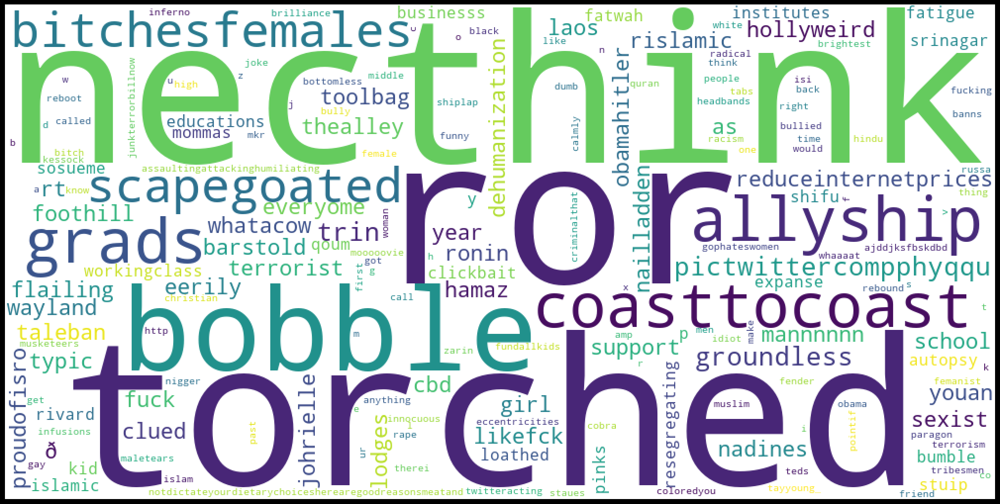

In [ ]:
make_word_cloud(bad_words)

<b><i> Testing our code for text generation via omitting the bad words across all categories.

In [ ]:
# User input
user_input = input("Enter a tweet text: ")

# Exclude bad words from input

# Generate text completion
completed_text = complete_text(user_input)
print("Completed text:",completed_text)

filtered_input_words = [word for word in completed_text.split() if word.lower() not in bad_words]
filtered_input = " ".join(filtered_input_words)

print('------')
print("Completed filtered text:", filtered_input)

Enter a tweet text: Pakistan is a Terrorist Nation.


C:\Users\ADMIN\AppData\Roaming\Python\Python310\site-packages\transformers\generation\configuration_utils.py:362: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.7` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
C:\Users\ADMIN\AppData\Roaming\Python\Python310\site-packages\transformers\generation\configuration_utils.py:367: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.95` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


Completed text: Pakistan is a Terrorist Nation.

The United States has been accused of supporting the Taliban in Afghanistan, and has also been implicated in the killing of American soldiers in Pakistan. The United Nations has accused the United Kingdom of providing arms to the Pakistani
------
Completed filtered text: Pakistan is Nation. The United States has been accused of supporting the Taliban in Afghanistan, and has also been implicated in the killing of American soldiers in Pakistan. The United Nations has accused the United Kingdom of providing arms to the Pakistani


## <b> Conclusion:
<b> <i>Based on our three main focus areas and project scope, we can say that we were successfully able to compare and generate the negative words in each cyberbullying type category, complete and detect the tweet text type based on the tweet texts present in our dataset, and also help in text generation such that negative sentiment words are not autosuggested by the system, when user inputs any tweet text. This would help us create a better social media platform by keeping it safe and positive for all users.
    
We would like to add that text generation and detection is very time extensive and dynamic as new words, slangs, etc. keep on adding every day and differ by usage, cultural context, language, etc. But it is a very interesting field and we would love to explore and add.